In [2]:

!nvidia-smi

Tue Feb 11 09:07:35 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.11 MiB | 18.55 MiB/s, done.
Resolving deltas: 100% (11861/11861), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 86.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# **Roboflow integration to export dataset**

In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [5]:
#!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ljgifHMHsCdKO7A8FveH")
project = rf.workspace("final-year-project-k0wuq").project("acute-lymphoblastic-leukemia-jlapf")
version = project.version(3)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Acute-Lymphoblastic-Leukemia-3 in yolov5pytorch:: 100%|██████████| 3012/3012 [00:00<00:00, 9822.31it/s] 


In [6]:
!wandb disabled

W&B disabled.


In [7]:
print(dataset.location)

/content/datasets/Acute-Lymphoblastic-Leukemia-3


In [8]:
!python train.py --img 640 --batch 16 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5n.pt --cache --workers 3 --patience 100 --project comparison --name img640

Streaming output truncated to the last 5000 lines.
    214/249      2.44G    0.01597   0.006714    0.01209         30        640:  12% 8/67 [00:01<00:14,  4.05it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    214/249      2.44G    0.01583   0.006755    0.01192         36        640:  13% 9/67 [00:02<00:13,  4.42it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    214/249      2.44G    0.01591   0.006794    0.01166         34        640:  15% 10/67 [00:02<00:14,  4.02it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    214/249      2.44G    0.01537   0.0

In [11]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs
%reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
#!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache --workers 3 --patience 20 --project comparison --name img640

In [12]:
!python detect.py --weights /content/yolov5/comparison/img640/weights/best.pt --img 640 --conf 0.5 --source {dataset.location}/test/images

detect: weights=['/content/yolov5/comparison/img640/weights/best.pt'], source=/content/datasets/Acute-Lymphoblastic-Leukemia-3/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
image 1/151 /content/datasets/Acute-Lymphoblastic-Leukemia-3/test/images/UID_16_13_2_all_bmp.rf.82f7de8dcfb1d1803ed60708dfc2ecb5.jpg: 640x640 1 0, 6.7ms
image 2/151 /content/datasets/Acute-Lymphoblastic-Leukemia-3/test/images/UID_16_17_2_all_bmp.rf.a9b32dd

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

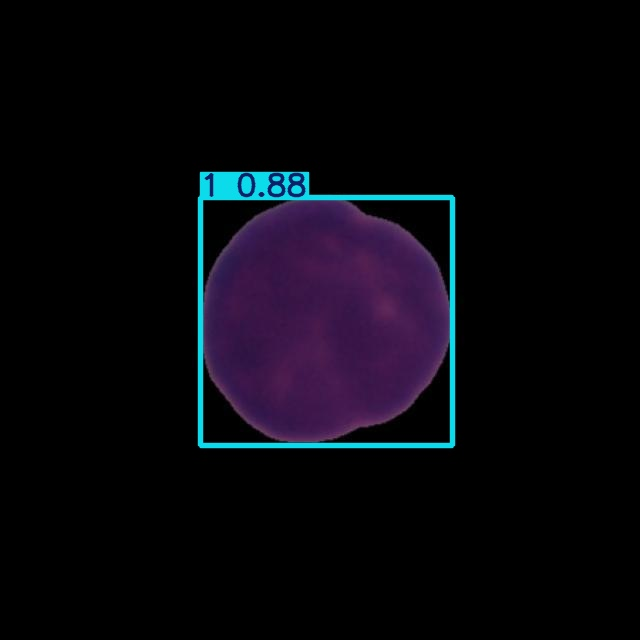

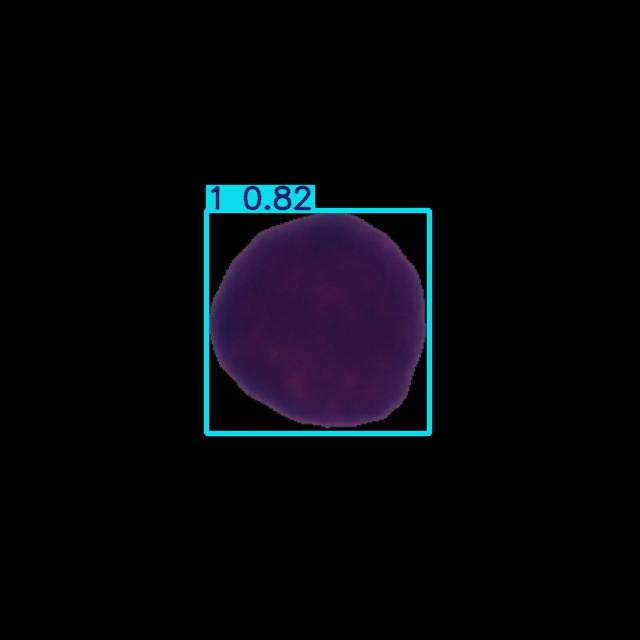

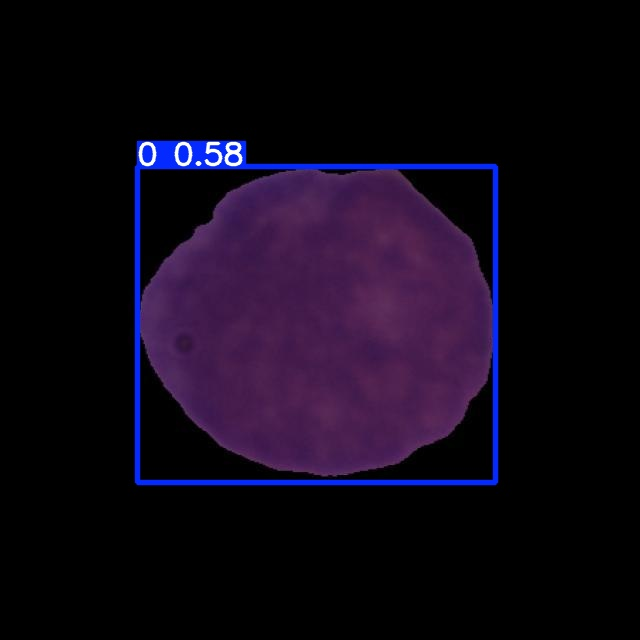

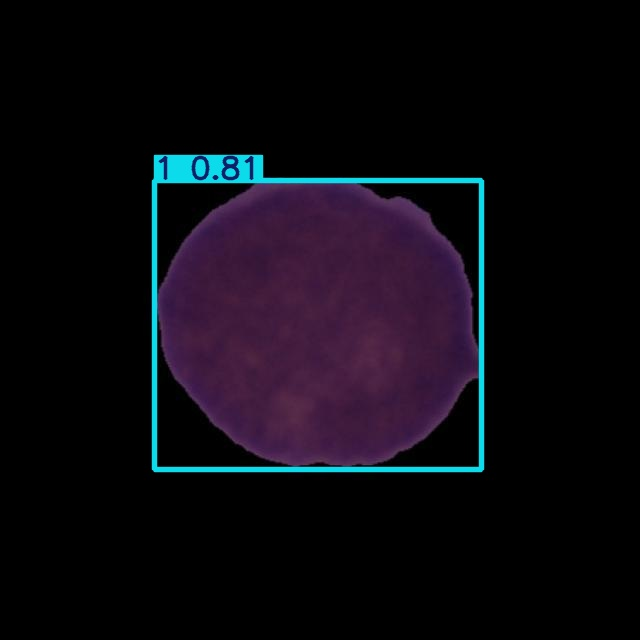

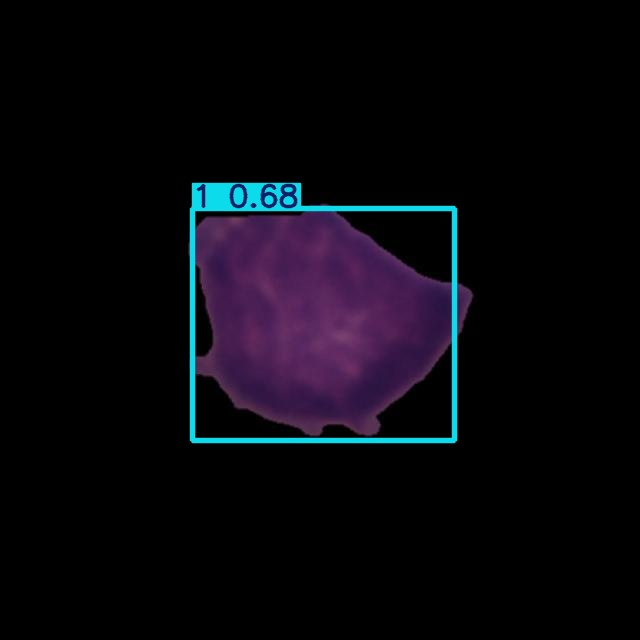

...

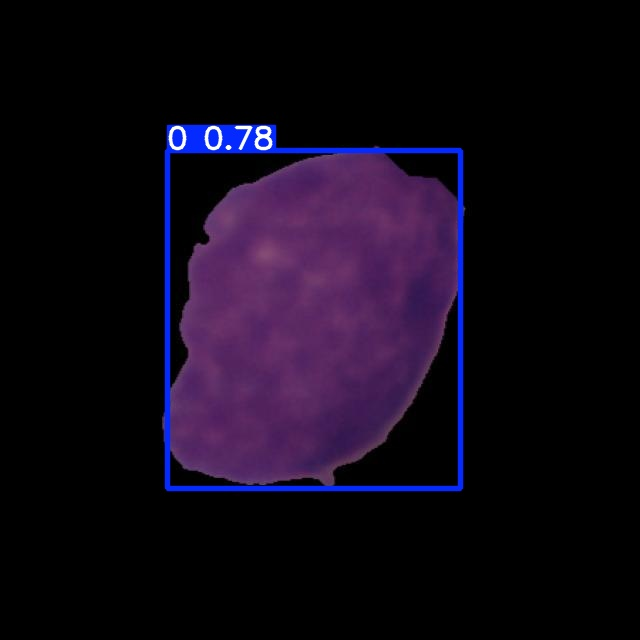

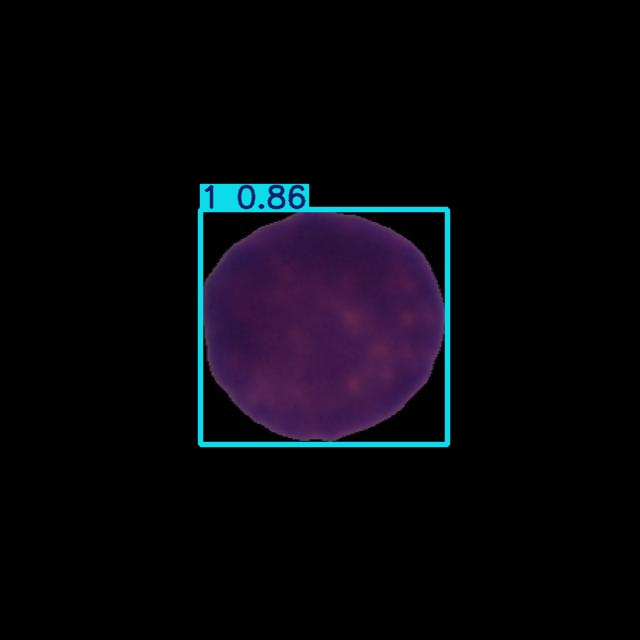

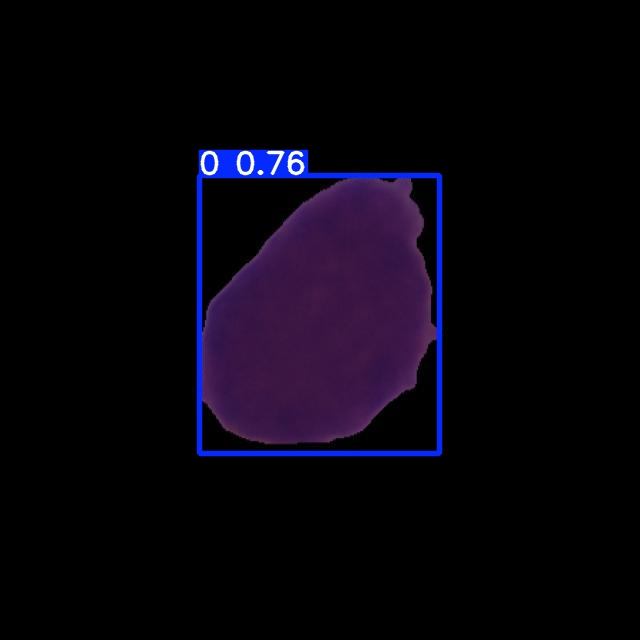

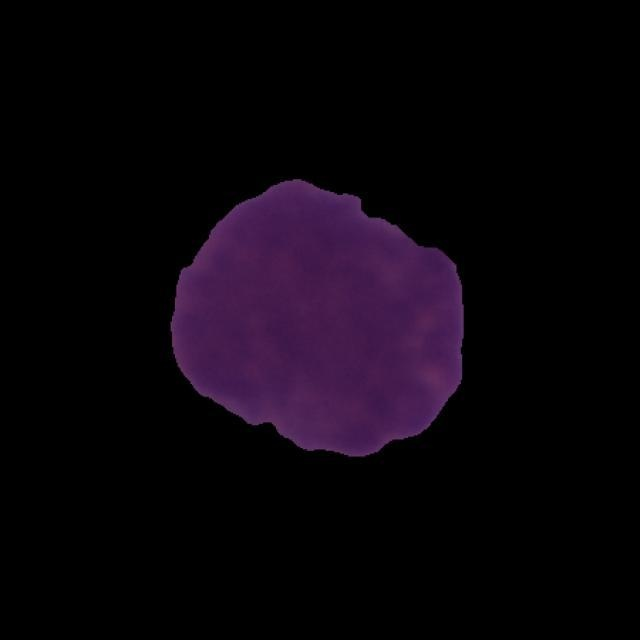

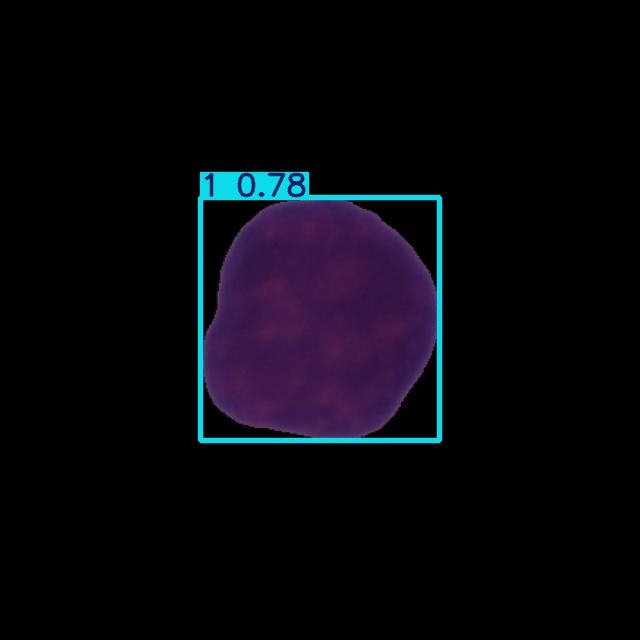

In [13]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [15]:
#export your model's weights for future use
from google.colab import files
files.download('/content/yolov5/comparison/img640/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
!python val.py --weights /content/yolov5/comparison/img640/weights/best.pt --img 640 --conf 0.5 --data /content/datasets/Acute-Lymphoblastic-Leukemia-3/data.yaml  --task test


val: data=/content/datasets/Acute-Lymphoblastic-Leukemia-3/data.yaml, weights=['/content/yolov5/comparison/img640/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.5, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
test: Scanning /content/datasets/Acute-Lymphoblastic-Leukemia-3/test/labels... 151 images, 0 backgrounds, 0 corrupt: 100% 151/151 [00:00<00:00, 1516.30it/s]
test: New cache created: /content/datasets/Acute-Lymphoblastic-Leukemia-3/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-

In [30]:
!python val.py --weights /content/yolov5/comparison/img640/weights/best.pt --img 640 --batch 16 --conf 0.5 --data /content/datasets/Acute-Lymphoblastic-Leukemia-3/data.yaml  --task test


val: data=/content/datasets/Acute-Lymphoblastic-Leukemia-3/data.yaml, weights=['/content/yolov5/comparison/img640/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.5, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.5 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1761871 parameters, 0 gradients, 4.1 GFLOPs
test: Scanning /content/datasets/Acute-Lymphoblastic-Leukemia-3/test/labels.cache... 151 images, 0 backgrounds, 0 corrupt: 100% 151/151 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 10/10 [00:03<00:00,  2.83it/s]
                   all        151        154      0.902 

In [16]:
print(dataset.location)

/content/datasets/Acute-Lymphoblastic-Leukemia-3


In [ ]:
from ultralytics import YOLO